#1).....Extracting feature with ResNet50......

In [1]:
!unzip /content/tree.zip

Archive:  /content/tree.zip
  inflating: tree/2367idea99litchi_root_rot.jpg  
  inflating: tree/akasia (1).jfif    
  inflating: tree/akasia (1).jpg     
  inflating: tree/akasia (10).jfif   
  inflating: tree/akasia (2).jfif    
  inflating: tree/akasia (2).jpg     
  inflating: tree/akasia (3).jfif    
  inflating: tree/akasia (4).jfif    
  inflating: tree/akasia (5).jfif    
  inflating: tree/akasia (6).jfif    
  inflating: tree/akasia (7).jfif    
  inflating: tree/akasia (8).jfif    
  inflating: tree/akasia (9).jfif    
  inflating: tree/aonla (1).jfif     
  inflating: tree/aonla (2).jfif     
  inflating: tree/aonla (3).jfif     
  inflating: tree/aonla (4).jfif     
  inflating: tree/aonla (5).jfif     
  inflating: tree/aonla (6).jfif     
  inflating: tree/aonla (7).jfif     
  inflating: tree/aonla (8).jfif     
  inflating: tree/BetalNuts (1).jpg  
  inflating: tree/BetalNuts (10).jpg  
  inflating: tree/BetalNuts (11).jpg  
  inflating: tree/BetalNuts (12).jpg  
  infla

In [62]:
from os import listdir
from pickle import dump
from keras.applications.resnet import ResNet50
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.resnet import preprocess_input
from keras.models import Model

# extract features from each photo in the directory
def extract_features(directory):
	# load the model

	model = ResNet50()

 
	# re-structure the model
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
	# summarize
	print(model.summary())
	# extract features from each photo
	features = dict()
	for name in listdir(directory):
		# load an image from file
		filename = directory + '/' + name
		image = load_img(filename, target_size=(224, 224))
		# convert the image pixels to a numpy array
		image = img_to_array(image)
		# reshape data for the model
		image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
		# prepare the image for the VGG model
		image = preprocess_input(image)
		# get features
		feature = model.predict(image, verbose=0)
		# get image id
		image_id = name.split('.')[0]
		# store feature
		features[image_id] = feature
		print('>%s' % name)
	return features

# extract features from all images
directory = 'tree'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('tree_features.pkl', 'wb'))

102981632/102967424 [==============================] - 1s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                         

# 2).....Import The Pkl File,Check features..........

In [63]:
import pickle
pickle_in = open("tree_features.pkl","rb")
features = pickle.load(pickle_in)

In [64]:
len(features)

714

In [65]:
features['BetalNuts (1)'][0,10:100]

array([1.9120990e-04, 3.7056240e-04, 5.9143495e-04, 6.2129708e-05,
       2.6187638e-04, 1.8476606e-04, 2.8157234e-05, 6.5706656e-05,
       2.6558246e-05, 2.3667031e-05, 1.2180275e-06, 6.8630325e-05,
       2.7510430e-05, 1.7296802e-04, 1.1229875e-05, 1.5616793e-05,
       3.5294830e-05, 1.7936205e-05, 1.4779987e-05, 1.1491427e-04,
       3.0307381e-06, 6.5044810e-06, 3.3824774e-06, 2.2134342e-05,
       4.5735313e-05, 5.6825989e-05, 2.9329531e-05, 1.5681063e-06,
       1.1138414e-05, 1.8115779e-05, 4.2957772e-06, 1.4927819e-05,
       6.2042404e-06, 7.3398303e-05, 5.6192634e-06, 2.3452786e-04,
       2.1911053e-06, 1.9684550e-05, 1.1696599e-06, 1.3145010e-06,
       4.6595527e-05, 9.0306385e-06, 3.1147233e-06, 4.6777321e-05,
       9.2177306e-06, 1.7474556e-05, 3.3563883e-06, 8.5714837e-06,
       1.1015958e-05, 6.3593914e-05, 8.4209651e-06, 2.3186105e-07,
       8.3575042e-06, 5.7875921e-05, 6.4723827e-05, 6.2476500e-04,
       1.0803168e-05, 6.5099798e-06, 1.0085075e-05, 2.6091486e

In [66]:
features

{'2367idea99litchi_root_rot': array([[6.35145443e-06, 5.60887156e-06, 3.77128231e-06, 2.07105077e-05,
         1.36886529e-05, 8.51300456e-07, 2.59816147e-06, 3.54955904e-04,
         1.30040955e-03, 5.18405723e-05, 1.60063821e-04, 7.16602008e-05,
         2.03763193e-04, 1.24433218e-03, 8.37662839e-04, 1.47325778e-03,
         2.68403692e-05, 2.30574107e-04, 6.03678287e-04, 7.03222395e-05,
         3.37519668e-05, 1.05651794e-03, 1.58114173e-03, 7.24236364e-04,
         1.80191011e-03, 3.09223891e-04, 2.30275909e-04, 1.83250857e-04,
         5.10854334e-05, 1.64406920e-05, 1.45950689e-04, 4.52376735e-05,
         1.29554232e-04, 2.68437743e-05, 2.68174190e-05, 3.04355810e-04,
         5.58847038e-04, 2.33620452e-03, 4.21309174e-04, 8.49941338e-04,
         2.27043129e-04, 2.69379956e-03, 1.39743337e-04, 1.08933009e-01,
         8.79203668e-04, 4.35360882e-04, 4.45840327e-04, 2.09184684e-04,
         2.56657731e-02, 6.53718947e-04, 4.21141885e-05, 1.94843713e-04,
         1.63230754e-0

In [67]:
label = {}

# 3)......... Class Create for Tree Classification.....

In [68]:
def get_class(ipt):
    class_id = 0
    if 'BetalNuts' in ipt : 
        class_id = 1
    elif 'GoldenApple' in ipt : 
        class_id = 2
    elif 'Guava' in ipt : 
        class_id = 3
    elif   'KalaKoroi' in ipt : 
        class_id = 4
    elif   'RajKoroi' in ipt : 
        class_id = 5
    elif 'akasia' in ipt : 
        class_id = 6
    elif  'aonla' in ipt : 
        class_id = 7
    elif  'bh' in ipt : 
        class_id = 8
    elif  'ca' in ipt : 
        class_id = 9
    elif  'cocunat' in ipt : 
        class_id = 10
    elif  'aonla' in ipt : 
        class_id = 11
    elif  'cowa' in ipt : 
        class_id = 12
    elif  'elepapple' in ipt : 
        class_id = 13
    elif  'indolive' in ipt : 
        class_id = 14
    elif  'jackfruit' in ipt : 
        class_id = 15
    elif  'karanja' in ipt : 
        class_id = 16
    elif  'lictree' in ipt : 
        class_id = 17
    elif  'mango' in ipt : 
        class_id = 18
    elif  'mehogoni' in ipt : 
        class_id = 19
    elif  'mojatree' in ipt : 
        class_id = 20
    elif  'neem' in ipt : 
        class_id = 21
    elif  'payara' in ipt : 
        class_id = 22
    elif  'plplam' in ipt : 
        class_id = 23
    elif  'pummelo' in ipt : 
        class_id = 24
    elif  'rantree' in ipt : 
        class_id = 25
    elif  'riverevony' in ipt : 
        class_id = 26
    elif  'sepota' in ipt : 
        class_id = 27
    elif  'shemul' in ipt : 
        class_id = 28
    elif  'sonalu' in ipt : 
        class_id = 29
    elif  'tamarind' in ipt : 
        class_id = 30
    elif  'velapple' in ipt : 
        class_id = 31
    elif  'wa' in ipt : 
        class_id = 32
    else :
     print("I don't know")

    return class_id

In [72]:
for key, value in features.items() :
    label[key] = get_class(key)

I don't know
I don't know
I don't know
I don't know


In [73]:
get_class('wa (4)')

32

In [74]:
label['mojatree (5)']

20

# 4).....Create Numpy Array, Train Test Splite......

In [75]:
x = []
y = []

In [77]:
for key, value in features.items() :
    x.append(features[key][0])
    y.append(label[key])

In [78]:
import numpy as np
x=np.array(x)
y=np.array(y)

In [79]:
x[1].shape

(1000,)

In [80]:
print (type(x))
print (type(y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [81]:
import numpy as np
x_train_data=np.array(x)
y_train_data=np.array(y)

In [82]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=800, shuffle=True)
#x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=800, shuffle=True)

#5)...Check Train Test Accuracy With svm

In [83]:
from sklearn import svm
#clf = svm.SVC(kernel='linear', C = 10.0, gamma=0.1)
#clf = svm.SVC()
#clf = svm.SVC(kernel='poly', degree=8)
#clf = svm.SVC(kernel='poly')
clf = svm.SVC(kernel='rbf')
#clf = svm.SVC(kernel='sigmoid')

#clf= svm.SVC(kernel='linear') 
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 37.76223776223776%


#6)Clasiification report (precision, recall,f1-score)

In [84]:
from sklearn.metrics import classification_report, confusion_matrix
#class_names = get_class
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.67      0.29      0.40         7
           2       0.25      0.17      0.20         6
           3       0.57      0.44      0.50         9
           4       0.00      0.00      0.00         5
           5       1.00      1.00      1.00         1
           6       0.00      0.00      0.00         3
           7       0.00      0.00      0.00         1
           8       0.67      0.33      0.44         6
           9       0.33      1.00      0.50         1
          10       0.62      0.83      0.71         6
          12       0.50      1.00      0.67         1
          13       0.41      0.58      0.48        12
          14       0.18      0.71      0.29         7
          15       0.80      0.50      0.62         8
          16       0.00      0.00      0.00         1
          17       0.50      0.17      0.25         6
          18       0.29      0.88      0.44         8
          19       0.00    

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#7)Confusion matrix

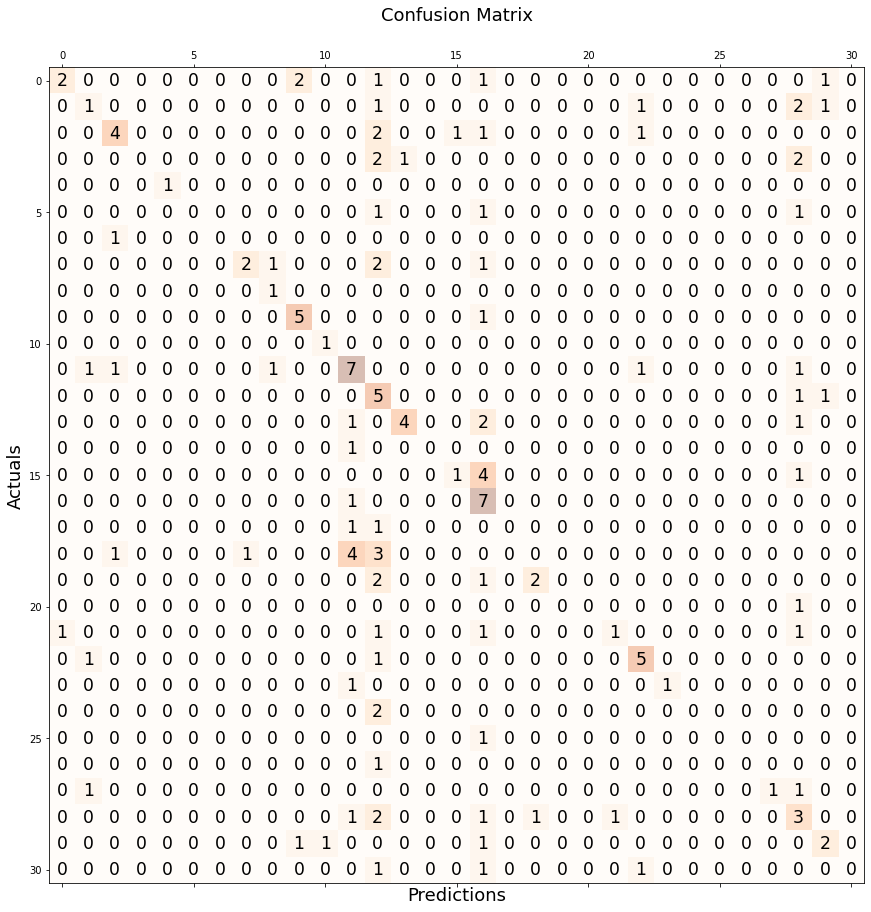

In [85]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import matplotlib.pyplot as plt
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(15, 15))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

#8)...Check Train Test Accuracy With Random Forest

In [86]:
from sklearn.ensemble import RandomForestClassifier

clf=RandomForestClassifier(n_estimators=40)

clf.fit(x_train,y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 97.2027972027972%


#5)...Check Train Test Accuracy With SVM,Roc Curve, PRC

In [87]:
#train accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

Accuracy: 42.17898832684825%


In [88]:
#test Accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)

#clf = svm.SVC(kernel='poly')

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 30.76923076923077%


In [89]:
!pip install scikit-plot

ValueError: ignored

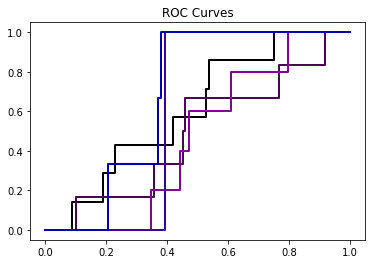

In [90]:
# roc Curve For Svm
import scikitplot as plt
from sklearn import svm
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
plt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

ValueError: ignored

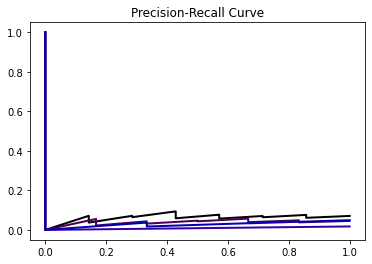

In [91]:
#Precision-Recall Curve for svm
import scikitplot as skplt
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt

#6)...Check Train Test Accuracy With Logistic Regression,Roc Curve, PRC

In [ ]:
#train accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

In [92]:
#test accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))


Accuracy: 30.76923076923077%


ValueError: ignored

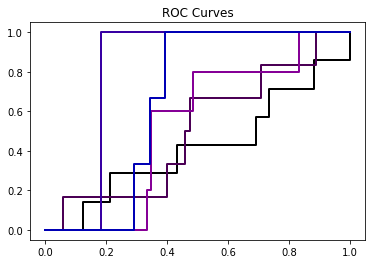

In [93]:
# roc Curve For Logistic Regresion
import scikitplot as skplt
from sklearn.linear_model import LogisticRegression
clfrf=LogisticRegression()
clfrf = clfrf.fit(x_train, y_train)
y_probas = clfrf.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

ValueError: ignored

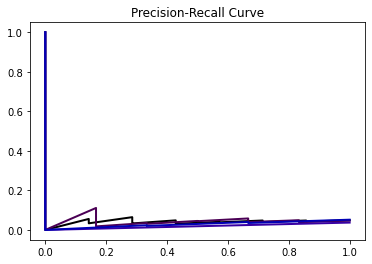

In [94]:
import scikitplot as skplt

from sklearn.linear_model import LogisticRegression
clfknnn = LogisticRegression()
clfknnn = clfknnn.fit(x_train, y_train)
y_probas = clfknnn.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, 
classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt


#7)......For Increase the accuracy K=5 fold cross Validation.....

In [95]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=4)

kf.get_n_splits(x)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [ 357  358  359 ... 1425 1426 1427] TEST: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 2

In [96]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
clf = svm.SVC(kernel='linear')
scores = cross_val_score(clf, x, y, cv=5)
scores
print("Accuracy: %0.2f (+/- %0.2f)" % ((scores.mean())*100, scores.std() * 2))

Accuracy: 31.72 (+/- 0.04)
